In [1]:
!pip install geopandas rasterio shapely matplotlib leafmap opencv-python tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.1/568.1 kB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.7/220.7 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 837.4/837.4 kB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.8/206.8 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.5 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!apt-get install tree


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (144 kB/s)
Selecting previously unselected package tree.
(Reading database ... 126308 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [4]:
!tree /content/drive/MyDrive/IITG_assignments/archive/rgb


Streaming output truncated to the last 5000 lines.
├── 28.5590_77.6058.png
├── 28.5590_77.6146.png
├── 28.5590_77.6234.png
├── 28.5590_77.6322.png
├── 28.5590_77.6410.png
├── 28.5590_77.6443.png
├── 28.5678_76.8558.png
├── 28.5678_76.8646.png
├── 28.5678_76.8734.png
├── 28.5678_76.8822.png
├── 28.5678_76.8910.png
├── 28.5678_76.8943.png
├── 28.5678_76.9057.png
├── 28.5678_76.9145.png
├── 28.5678_76.9233.png
├── 28.5678_76.9321.png
├── 28.5678_76.9409.png
├── 28.5678_76.9443.png
├── 28.5678_76.9558.png
├── 28.5678_76.9646.png
├── 28.5678_76.9734.png
├── 28.5678_76.9822.png
├── 28.5678_76.9910.png
├── 28.5678_76.9944.png
├── 28.5678_77.0058.png
├── 28.5678_77.0146.png
├── 28.5678_77.0234.png
├── 28.5678_77.0322.png
├── 28.5678_77.0410.png
├── 28.5678_77.0443.png
├── 28.5678_77.0557.png
├── 28.5678_77.0645.png
├── 28.5678_77.0733.png
├── 28.5678_77.0821.png
├── 28.5678_77.0909.png
├── 28.5678_77.0944.png
├── 28.5678_77.1058.png
├── 28.5678_77.1146.png
├── 28.5678_77.1234.png
├── 28.5678_7

In [5]:
!pwd

/content


#Q1 Spatial Reasoning & Data Filtering [5 Marks]

#Q1.1 Plot the Delhi-NCR shapefile using matplotlib and overlay a 60×60 km uniform grid (1 marks)


#Step 1: Load and Plot Delhi-NCR GeoJSON

CRS: EPSG:4326


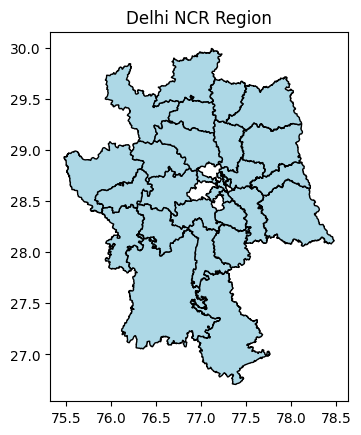

In [6]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load Delhi-NCR GeoJSON
delhi_ncr = gpd.read_file("/content/drive/MyDrive/IITG_assignments/archive/delhi_ncr_region.geojson")
print("CRS:", delhi_ncr.crs)

# Plot
delhi_ncr.plot(edgecolor='black', facecolor='lightblue')
plt.title("Delhi NCR Region")
plt.show()


#Step 2: Create 60x60 km Grid Over Reprojected Delhi-NCR

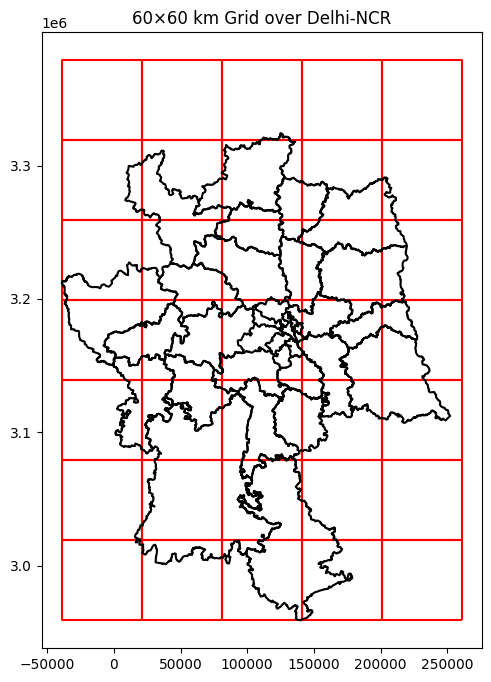

In [7]:
from shapely.geometry import box
import numpy as np

# Reproject to UTM Zone 44N
delhi_ncr_utm = delhi_ncr.to_crs(epsg=32644)

# Bounding box
minx, miny, maxx, maxy = delhi_ncr_utm.total_bounds

# Create grid
grid_size = 60000  # meters
grid_cells = []
for x0 in np.arange(minx, maxx, grid_size):
    for y0 in np.arange(miny, maxy, grid_size):
        x1, y1 = x0 + grid_size, y0 + grid_size
        grid_cells.append(box(x0, y0, x1, y1))

# Convert to GeoDataFrame
grid = gpd.GeoDataFrame({'geometry': grid_cells}, crs='EPSG:32644')

# Plot grid on Delhi-NCR
fig, ax = plt.subplots(figsize=(8, 8))
grid.boundary.plot(ax=ax, edgecolor='red')
delhi_ncr_utm.boundary.plot(ax=ax, color='black')
plt.title("60×60 km Grid over Delhi-NCR")
plt.show()


#Q1.2 Overlay this grid on a satellite basemap using geemap or leafmap (1 mark)


In [8]:
import leafmap.foliumap as leafmap

# Convert both to EPSG:4326 for web mapping
grid_wgs = grid.to_crs(epsg=4326)
delhi_ncr_wgs = delhi_ncr.to_crs(epsg=4326)

# Map
m = leafmap.Map(center=[28.6, 77.2], zoom=8)
m.add_basemap("SATELLITE")
m.add_gdf(delhi_ncr_wgs, layer_name="Delhi NCR")
m.add_gdf(grid_wgs, layer_name="Grid")
m


#Q1.3 Mark the four corners and the center of each grid cell (1 mark)


In [ ]:
# from shapely.geometry import Point

# # Get center and corner points
# centers, corners = [], []
# for cell in grid.geometry:
#     minx, miny, maxx, maxy = cell.bounds
#     centers.append(Point((minx + maxx)/2, (miny + maxy)/2))
#     corners.extend([
#         Point(minx, miny), Point(minx, maxy),
#         Point(maxx, miny), Point(maxx, maxy)
#     ])

# # Convert to GeoDataFrame (WGS84)
# center_gdf = gpd.GeoDataFrame(geometry=centers, crs=grid.crs).to_crs(epsg=4326)
# corner_gdf = gpd.GeoDataFrame(geometry=corners, crs=grid.crs).to_crs(epsg=4326)

# # Add to map
# m.add_gdf(center_gdf, layer_name="Centers")
# m.add_gdf(corner_gdf, layer_name="Corners")
# m


In [10]:
import geopandas as gpd
import numpy as np
from shapely.geometry import box, Point
import leafmap.foliumap as leafmap

# Load Delhi-NCR GeoJSON
delhi_ncr = gpd.read_file("/content/drive/MyDrive/IITG_assignments/archive/delhi_ncr_region.geojson")

# Reproject to UTM (meters) for grid creation
delhi_ncr_utm = delhi_ncr.to_crs(epsg=32644)

# Bounding box and grid parameters
minx, miny, maxx, maxy = delhi_ncr_utm.total_bounds
grid_size = 60000  # 60×60 km

# Generate grid cells
grid_cells = []
for x0 in np.arange(minx, maxx, grid_size):
    for y0 in np.arange(miny, maxy, grid_size):
        x1, y1 = x0 + grid_size, y0 + grid_size
        grid_cells.append(box(x0, y0, x1, y1))

# Create grid GeoDataFrame
grid = gpd.GeoDataFrame({'geometry': grid_cells}, crs='EPSG:32644')

# Compute center and corner points
centers, corners = [], []
for cell in grid.geometry:
    minx, miny, maxx, maxy = cell.bounds
    centers.append(Point((minx + maxx) / 2, (miny + maxy) / 2))
    corners.extend([
        Point(minx, miny), Point(minx, maxy),
        Point(maxx, miny), Point(maxx, maxy)
    ])

# Convert points to GeoDataFrames and reproject to WGS84
center_gdf = gpd.GeoDataFrame(geometry=centers, crs=grid.crs).to_crs(epsg=4326)
corner_gdf = gpd.GeoDataFrame(geometry=corners, crs=grid.crs).to_crs(epsg=4326)

# Convert grid and boundary to WGS84 for web display
grid_wgs = grid.to_crs(epsg=4326)
delhi_ncr_wgs = delhi_ncr.to_crs(epsg=4326)

# Create Leafmap map
m = leafmap.Map(center=[28.6, 77.2], zoom=8)
m.add_basemap("SATELLITE")

# Add polygon layers
m.add_gdf(delhi_ncr_wgs, layer_name="Delhi NCR")
m.add_gdf(grid_wgs, layer_name="Grid")

# Prepare center and corner DataFrames for plotting
center_df = center_gdf.copy()
center_df["name"] = "Center"
center_df["lon"] = center_df.geometry.x
center_df["lat"] = center_df.geometry.y

corner_df = corner_gdf.copy()
corner_df["name"] = "Corner"
corner_df["lon"] = corner_df.geometry.x
corner_df["lat"] = corner_df.geometry.y

# Add points using add_points_from_xy
m.add_points_from_xy(center_df, x="lon", y="lat", layer_name="Centers", color="blue", radius=6)
m.add_points_from_xy(corner_df, x="lon", y="lat", layer_name="Corners", color="red", radius=4)

# Add layer control
m.add_layer_control()

# Display map
m


#Q1.4 Filter images based on whether their center coordinates fall within the grid (1 mark)

#Q1.5 Count and report the number of images before and after filtering (1 mark)

In [11]:
import os
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# -----------------------------
# Q4: Filter images based on center coordinates falling within grid
# -----------------------------

# Path to image folder
image_folder = "/content/drive/MyDrive/IITG_assignments/archive/rgb"
image_files = [f for f in os.listdir(image_folder) if f.endswith(".png")]

# Extract lat/lon from filenames
image_data = []
for fname in image_files:
    try:
        lat_str, lon_str = fname.replace(".png", "").split("_")
        lat, lon = float(lat_str), float(lon_str)
        image_data.append({"filename": fname, "latitude": lat, "longitude": lon})
    except:
        continue  # skip malformed filenames

# Convert to GeoDataFrame with EPSG:4326
df = pd.DataFrame(image_data)
gdf_images = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df["longitude"], df["latitude"]), crs="EPSG:4326")

# Spatial join with grid_wgs from Q3
gdf_filtered = gpd.sjoin(gdf_images, grid_wgs, how="inner", predicate="within")

# -----------------------------
# Q5: Count and report results
# -----------------------------
total_images = len(gdf_images)
filtered_images = len(gdf_filtered)

print(f"Total images before filtering: {total_images}")
print(f"Images after filtering (within grid): {filtered_images}")

# Optional: list of filtered image filenames
filtered_filenames = gdf_filtered["filename"].tolist()


Total images before filtering: 9216
Images after filtering (within grid): 9216


#Q2. Label Construction & Dataset Preparation [10 Marks]


#Q2.1 For each image, extract a 128×128 patch from the land_cover.tif centered at the image's coordinate (2 marks)

In [12]:
import os
import numpy as np
import pandas as pd
from rasterio.windows import Window
import rasterio
from tqdm import tqdm

image_folder = "/content/drive/MyDrive/IITG_assignments/archive/rgb"
raster_path = "/content/drive/MyDrive/IITG_assignments/archive/worldcover_bbox_delhi_ncr_2021.tif"
image_files = [f for f in os.listdir(image_folder) if f.endswith(".png")]

label_data = []

with rasterio.open(raster_path) as src:
    for fname in tqdm(image_files):
        try:
            lat_str, lon_str = fname.replace(".png", "").split("_")
            lat, lon = float(lat_str), float(lon_str)

            row, col = src.index(lon, lat)
            window = Window(col - 64, row - 64, 128, 128)
            patch = src.read(1, window=window)

            label_data.append({
                "filename": fname,
                "latitude": lat,
                "longitude": lon,
                "patch": patch
            })
        except:
            continue


100%|██████████| 9216/9216 [00:09<00:00, 962.58it/s] 


In [34]:
import os
import rasterio
from rasterio.windows import Window
from tqdm import tqdm

image_folder = "/content/drive/MyDrive/IITG_assignments/archive/rgb"
raster_path = "/content/drive/MyDrive/IITG_assignments/archive/worldcover_bbox_delhi_ncr_2021.tif"
image_files = [f for f in os.listdir(image_folder) if f.endswith(".png")]

label_data = []

with rasterio.open(raster_path) as src:
    for fname in tqdm(image_files):
        try:
            lat_str, lon_str = fname.replace(".png", "").split("_")
            lat, lon = float(lat_str), float(lon_str)

            # Check if coordinates are within raster bounds
            if not (src.bounds.left <= lon <= src.bounds.right and
                    src.bounds.bottom <= lat <= src.bounds.top):
                continue

            row, col = src.index(lon, lat)

            # Check if window is within raster dimensions
            if (col - 64 >= 0 and row - 64 >= 0 and
                col + 64 <= src.width and row + 64 <= src.height):
                window = Window(col - 64, row - 64, 128, 128)
                patch = src.read(1, window=window)

                label_data.append({
                    "filename": fname,
                    "latitude": lat,
                    "longitude": lon,
                    "patch": patch
                })
        except (ValueError, rasterio.errors.RasterioError) as e:
            print(f"Error processing {fname}: {e}")
            continue

100%|██████████| 9216/9216 [00:05<00:00, 1566.22it/s]


#Q2.2 Assign a label using the mode (most frequent) land cover class in the patch (2 marks)


In [13]:
esa_class_map = {
    10: "Trees", 20: "Shrubland", 30: "Grassland", 40: "Cropland", 50: "Built-up",
    60: "Bare / sparse vegetation", 70: "Snow and ice", 80: "Permanent water bodies",
    90: "Herbaceous wetland", 95: "Mangroves", 100: "Moss and lichen"
}

labeled_data = []

for item in label_data:
    patch = item["patch"]
    patch = patch[(patch > 0) & (patch <= 100)]

    if patch.size == 0:
        mode_class = None
    else:
        mode_class = int(np.bincount(patch.flatten()).argmax())

    labeled_data.append({
        "filename": item["filename"],
        "latitude": item["latitude"],
        "longitude": item["longitude"],
        "esa_code": mode_class,
        "esa_label": esa_class_map.get(mode_class, "Unknown")
    })

df_labels = pd.DataFrame(labeled_data).dropna(subset=["esa_code"])


#Q2.3 Map ESA class codes to 11 standardized labels. (1 mark)

In [14]:
df_labels["esa_label"] = df_labels["esa_code"].map(esa_class_map)
df_labels[["filename", "esa_code", "esa_label"]].head()


,filename,esa_code,esa_label
0,28.8266_77.0443.png,40,Cropland
1,28.8679_77.4646.png,40,Cropland
2,28.8354_77.3321.png,40,Cropland
3,28.8178_77.3734.png,40,Cropland
4,28.8943_77.3734.png,40,Cropland


#Q2.4 Handle edge cases and discuss treatment of no-data pixels or mixed class dominance (2 marks)

In [15]:
patch = patch[(patch > 0) & (patch <= 100)]
df_labels = df_labels.dropna(subset=["esa_code"])


In [16]:
df_labels

,filename,latitude,longitude,esa_code,esa_label
0,28.8266_77.0443.png,28.8266,77.0443,40,Cropland
1,28.8679_77.4646.png,28.8679,77.4646,40,Cropland
2,28.8354_77.3321.png,28.8354,77.3321,40,Cropland
3,28.8178_77.3734.png,28.8178,77.3734,40,Cropland
4,28.8943_77.3734.png,28.8943,77.3734,40,Cropland
...,...,...,...,...,...
9211,28.2178_77.1322.png,28.2178,77.1322,40,Cropland
9212,28.2178_76.9734.png,28.2178,76.9734,40,Cropland
9213,28.2056_76.8646.png,28.2056,76.8646,50,Built-up
9214,28.2056_77.2910.png,28.2056,77.2910,40,Cropland


#Q2.5 Perform a 60/40 train-test split randomly (1 mark)


In [17]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(
    df_labels, test_size=0.4, random_state=42, stratify=df_labels["esa_label"]
)

print(f"Train size: {len(train_df)}")
print(f"Test size: {len(test_df)}")


Train size: 5529
Test size: 3687


#Q2.6 Visualize class distribution and discuss balance (or imbalance) (2 marks)


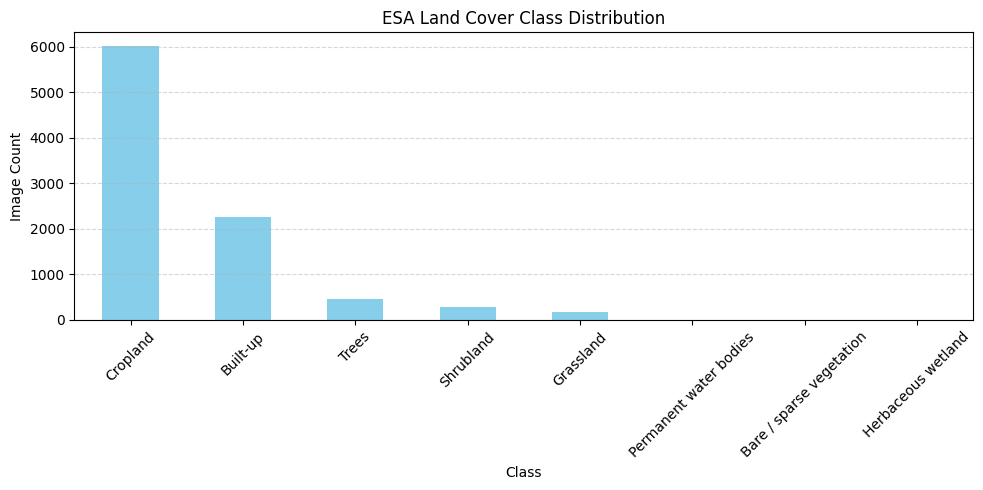

In [18]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
df_labels["esa_label"].value_counts().plot(kind="bar", color="skyblue")
plt.title("ESA Land Cover Class Distribution")
plt.xlabel("Class")
plt.ylabel("Image Count")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#Q3 Model Training & Supervised Evaluation [10 Marks]


#Q3.1 Train a CNN classifier (e.g., ResNet18) on the training set (3 marks)


In [27]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
import torchmetrics
from sklearn.metrics import confusion_matrix, f1_score
import seaborn as sns
import pandas as pd

# Custom dataset class with improved error handling
class LandCoverDataset(Dataset):
    def __init__(self, df, image_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label2idx = {label: i for i, label in enumerate(sorted(df['esa_label'].unique()))}
        self.idx2label = {v: k for k, v in self.label2idx.items()}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        try:
            row = self.df.loc[idx]
            img_path = os.path.join(self.image_dir, row["filename"])
            image = Image.open(img_path).convert("RGB")
            label = self.label2idx[row["esa_label"]]

            if self.transform:
                image = self.transform(image)

            return image, label
        except Exception as e:
            print(f"Error loading image {row['filename']}: {str(e)}")
            # Return a dummy image if there's an error
            dummy_image = torch.zeros(3, 128, 128) if self.transform else Image.new('RGB', (128, 128))
            return dummy_image, 0

# Enhanced transforms with data augmentation
train_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets and loaders
train_dataset = LandCoverDataset(train_df, image_folder, transform=train_transform)
test_dataset = LandCoverDataset(test_df, image_folder, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, num_workers=4, pin_memory=True)

# Load ResNet18
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(train_dataset.label2idx))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Loss, optimizer and scheduler
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3)

# Metric functions
def calculate_f1(preds, labels):
    preds = torch.argmax(preds, dim=1).cpu().numpy()
    labels = labels.cpu().numpy()
    return f1_score(labels, preds, average='weighted')

def calculate_accuracy(preds, labels):
    preds = torch.argmax(preds, dim=1)
    correct = (preds == labels).sum().item()
    return correct / len(labels)

# Initialize torchmetrics
tm_f1 = torchmetrics.F1Score(task="multiclass", num_classes=len(train_dataset.label2idx), average='weighted').to(device)
tm_acc = torchmetrics.Accuracy(task="multiclass", num_classes=len(train_dataset.label2idx)).to(device)

# Training loop with validation
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, epochs=20):
    best_metrics = {'f1': 0.0, 'acc': 0.0}
    history = {
        'train_loss': [], 'test_loss': [],
        'custom_f1': [], 'tm_f1': [],
        'custom_acc': [], 'tm_acc': []
    }

    for epoch in range(epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        history['train_loss'].append(epoch_loss)

        # Validation phase
        model.eval()
        test_loss = 0.0
        all_preds, all_labels = [], []

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                test_loss += loss.item() * images.size(0)

                all_preds.append(outputs)
                all_labels.append(labels)

        test_loss = test_loss / len(test_loader.dataset)
        history['test_loss'].append(test_loss)

        # Calculate metrics
        all_preds = torch.cat(all_preds)
        all_labels = torch.cat(all_labels)

        # Custom metrics
        history['custom_f1'].append(calculate_f1(all_preds, all_labels))
        history['custom_acc'].append(calculate_accuracy(all_preds, all_labels))

        # Torchmetrics
        history['tm_f1'].append(tm_f1(all_preds, all_labels).item())
        history['tm_acc'].append(tm_acc(all_preds, all_labels).item())

        scheduler.step(test_loss)

        # Save best model
        current_f1 = history['tm_f1'][-1]
        current_acc = history['tm_acc'][-1]
        if current_f1 > best_metrics['f1']:
            best_metrics['f1'] = current_f1
            torch.save(model.state_dict(), 'best_model_f1.pth')
        if current_acc > best_metrics['acc']:
            best_metrics['acc'] = current_acc
            torch.save(model.state_dict(), 'best_model_acc.pth')

        # Print epoch results
        print(f"Epoch {epoch+1}/{epochs}")
        print(f"Train Loss: {epoch_loss:.4f} | Test Loss: {test_loss:.4f}")
        print(f"F1 Score (Custom): {history['custom_f1'][-1]:.4f} | (TorchMetrics): {history['tm_f1'][-1]:.4f}")
        print(f"Accuracy (Custom): {history['custom_acc'][-1]:.4f} | (TorchMetrics): {history['tm_acc'][-1]:.4f}")
        print("-" * 60)

    return history

# Train the model
history = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler)





Epoch 1/20
Train Loss: 0.4661 | Test Loss: 0.2662
F1 Score (Custom): 0.9027 | (TorchMetrics): 0.9027
Accuracy (Custom): 0.9113 | (TorchMetrics): 0.9113
------------------------------------------------------------
Epoch 2/20
Train Loss: 0.2498 | Test Loss: 0.2427
F1 Score (Custom): 0.9136 | (TorchMetrics): 0.9136
Accuracy (Custom): 0.9148 | (TorchMetrics): 0.9148
------------------------------------------------------------
Epoch 3/20
Train Loss: 0.2027 | Test Loss: 0.2365
F1 Score (Custom): 0.9061 | (TorchMetrics): 0.9061
Accuracy (Custom): 0.9127 | (TorchMetrics): 0.9127
------------------------------------------------------------
Epoch 4/20
Train Loss: 0.1799 | Test Loss: 0.2434
F1 Score (Custom): 0.9165 | (TorchMetrics): 0.9165
Accuracy (Custom): 0.9151 | (TorchMetrics): 0.9151
------------------------------------------------------------
Epoch 5/20
Train Loss: 0.1754 | Test Loss: 0.2380
F1 Score (Custom): 0.9110 | (TorchMetrics): 0.9110
Accuracy (Custom): 0.9143 | (TorchMetrics): 0.9

#Q3.2 Evaluate using a custom F1 score implementation (2 marks)

#Q3.3 Evaluate using torchmetrics.F1Score and compare results (2 marks)

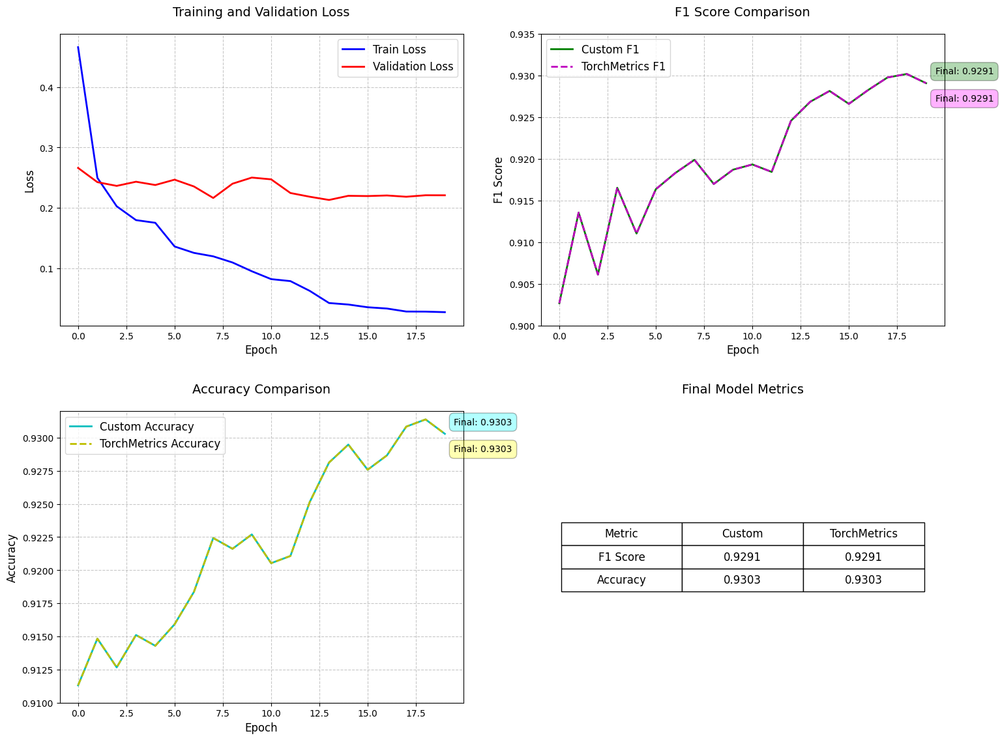

In [33]:
# Plot training history

plt.figure(figsize=(16, 12))

# Loss plot with improved styling
plt.subplot(2, 2, 1)
plt.plot(history['train_loss'], 'b-', linewidth=2, label='Train Loss')
plt.plot(history['test_loss'], 'r-', linewidth=2, label='Validation Loss')
plt.title('Training and Validation Loss', fontsize=14, pad=20)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# F1 Score plot with annotations
plt.subplot(2, 2, 2)
plt.plot(history['custom_f1'], 'g-', linewidth=2, label='Custom F1')
plt.plot(history['tm_f1'], 'm--', linewidth=2, label='TorchMetrics F1')
plt.title('F1 Score Comparison', fontsize=14, pad=20)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(0.9, 0.935)
plt.legend(fontsize=12)

# Add final value annotations
last_custom_f1 = history['custom_f1'][-1]
last_tm_f1 = history['tm_f1'][-1]
plt.annotate(f'Final: {last_custom_f1:.4f}',
             xy=(len(history['custom_f1'])-1, last_custom_f1),
             xytext=(10, 10), textcoords='offset points',
             bbox=dict(boxstyle='round,pad=0.5', fc='green', alpha=0.3))
plt.annotate(f'Final: {last_tm_f1:.4f}',
             xy=(len(history['tm_f1'])-1, last_tm_f1),
             xytext=(10, -20), textcoords='offset points',
             bbox=dict(boxstyle='round,pad=0.5', fc='magenta', alpha=0.3))

# Accuracy plot with improved formatting
plt.subplot(2, 2, 3)
plt.plot(history['custom_acc'], 'c-', linewidth=2, label='Custom Accuracy')
plt.plot(history['tm_acc'], 'y--', linewidth=2, label='TorchMetrics Accuracy')
plt.title('Accuracy Comparison', fontsize=14, pad=20)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(0.91, 0.932)
plt.legend(fontsize=12)

# Add final value annotations
last_custom_acc = history['custom_acc'][-1]
last_tm_acc = history['tm_acc'][-1]
plt.annotate(f'Final: {last_custom_acc:.4f}',
             xy=(len(history['custom_acc'])-1, last_custom_acc),
             xytext=(10, 10), textcoords='offset points',
             bbox=dict(boxstyle='round,pad=0.5', fc='cyan', alpha=0.3))
plt.annotate(f'Final: {last_tm_acc:.4f}',
             xy=(len(history['tm_acc'])-1, last_tm_acc),
             xytext=(10, -20), textcoords='offset points',
             bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.3))

# Add overall metrics table
plt.subplot(2, 2, 4)
plt.axis('off')
metrics_data = [
    ["Metric", "Custom", "TorchMetrics"],
    ["F1 Score", f"{last_custom_f1:.4f}", f"{last_tm_f1:.4f}"],
    ["Accuracy", f"{last_custom_acc:.4f}", f"{last_tm_acc:.4f}"]
]
table = plt.table(cellText=metrics_data,
                 loc='center',
                 cellLoc='center',
                 colWidths=[0.3, 0.3, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2)
plt.title('Final Model Metrics', fontsize=14, pad=20)

plt.tight_layout(pad=3.0)
plt.show()


#Q3.4 Show and explain a confusion matrix (2 marks)



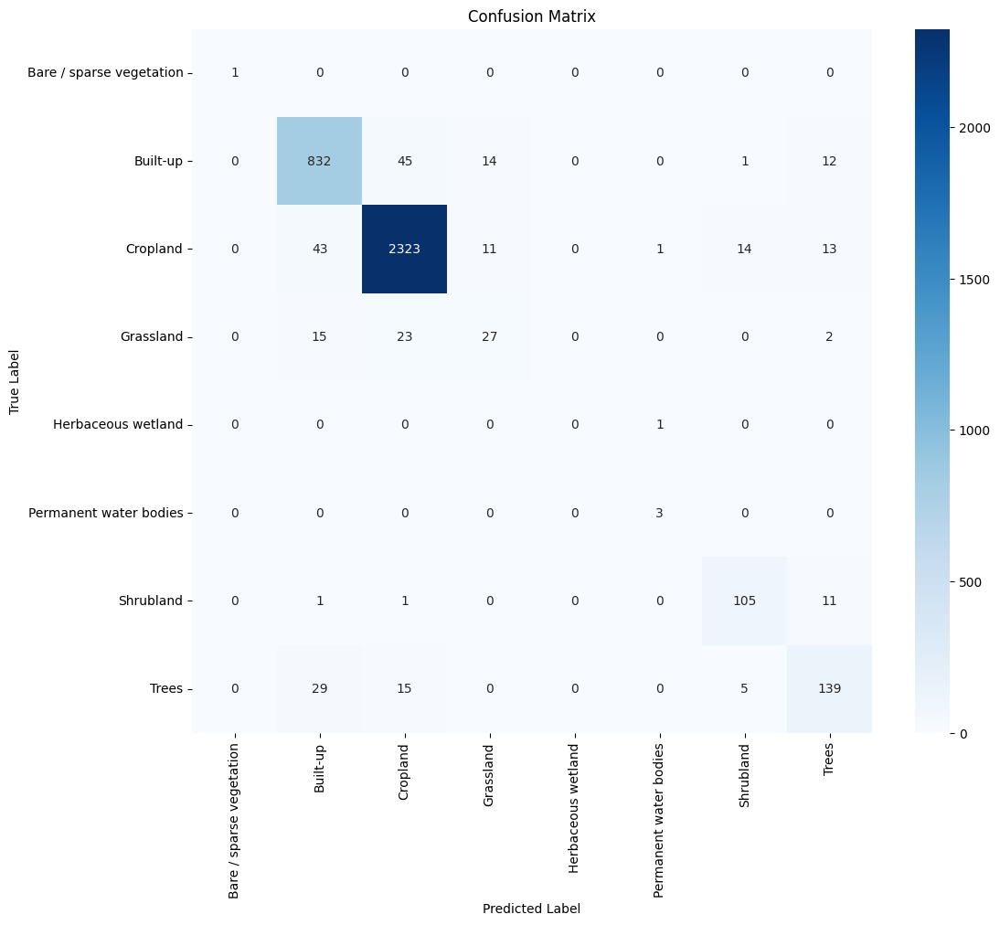

In [29]:
# Confusion matrix
def plot_confusion_matrix(model, loader):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=train_dataset.idx2label.values(),
                yticklabels=train_dataset.idx2label.values())
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

plot_confusion_matrix(model, test_loader)

#Q3.5 Plot 5 correct and 5 incorrect predictions with images and labels (1 mark)

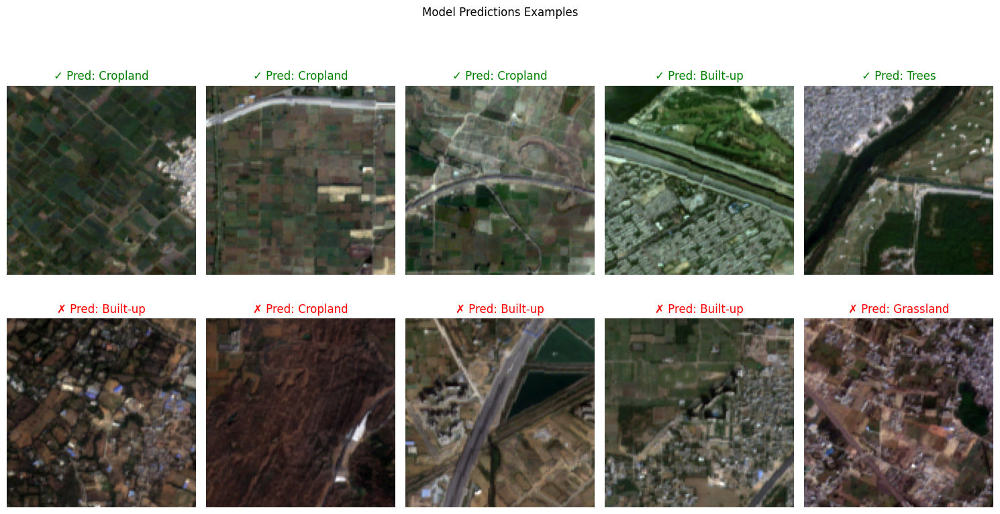

In [30]:
# Prediction visualization
def visualize_predictions(model, loader, num_examples=5):
    model.eval()
    correct, incorrect = [], []
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            for i in range(len(images)):
                img = images[i].cpu()
                pred = preds[i].item()
                label = labels[i].item()

                if len(correct) < num_examples and pred == label:
                    correct.append((img, pred, label))
                elif len(incorrect) < num_examples and pred != label:
                    incorrect.append((img, pred, label))

                if len(correct) >= num_examples and len(incorrect) >= num_examples:
                    break
            if len(correct) >= num_examples and len(incorrect) >= num_examples:
                break

    # Plot results
    plt.figure(figsize=(15, 8))
    plt.suptitle('Model Predictions Examples', y=1.02)

    for i, (img, pred, label) in enumerate(correct):
        img = img * std + mean  # Denormalize
        img = img.numpy().transpose(1, 2, 0).clip(0, 1)

        plt.subplot(2, num_examples, i+1)
        plt.imshow(img)
        plt.title(f'✓ Pred: {train_dataset.idx2label[pred]}', color='green')
        plt.xlabel(f'True: {train_dataset.idx2label[label]}')
        plt.axis('off')

    for i, (img, pred, label) in enumerate(incorrect):
        img = img * std + mean  # Denormalize
        img = img.numpy().transpose(1, 2, 0).clip(0, 1)

        plt.subplot(2, num_examples, num_examples+i+1)
        plt.imshow(img)
        plt.title(f'✗ Pred: {train_dataset.idx2label[pred]}', color='red')
        plt.xlabel(f'True: {train_dataset.idx2label[label]}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_predictions(model, test_loader)

In [31]:
from sklearn.metrics import accuracy_score
# Final evaluation report
def generate_report(model, loader):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate metrics
    report = {
        'accuracy': accuracy_score(all_labels, all_preds),
        'f1_weighted': f1_score(all_labels, all_preds, average='weighted'),
        'f1_macro': f1_score(all_labels, all_preds, average='macro'),
        'confusion_matrix': confusion_matrix(all_labels, all_preds)
    }

    print("\nFinal Evaluation Report:")
    print(f"Accuracy: {report['accuracy']:.4f}")
    print(f"F1 Score (Weighted): {report['f1_weighted']:.4f}")
    print(f"F1 Score (Macro): {report['f1_macro']:.4f}")

    return report

final_report = generate_report(model, test_loader)


Final Evaluation Report:
Accuracy: 0.9303
F1 Score (Weighted): 0.9291
F1 Score (Macro): 0.7134


#Second Approach

#Q3 Model Training & Supervised Evaluation [10 Marks]

#Q3.1 Train a CNN classifier (e.g., ResNet18) on the training set (3 marks)


In [19]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os

# Custom dataset class
class LandCoverDataset(Dataset):
    def __init__(self, df, image_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label2idx = {label: i for i, label in enumerate(sorted(df['esa_label'].unique()))}
        self.idx2label = {v: k for k, v in self.label2idx.items()}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.loc[idx]
        img_path = os.path.join(self.image_dir, row["filename"])
        image = Image.open(img_path).convert("RGB")
        label = self.label2idx[row["esa_label"]]
        if self.transform:
            image = self.transform(image)
        return image, label

# Transforms and loaders
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

train_dataset = LandCoverDataset(train_df, image_folder, transform=transform)
test_dataset = LandCoverDataset(test_df, image_folder, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)

# Load ResNet18
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(train_dataset.label2idx))  # Adjust output
model = model.to("cuda" if torch.cuda.is_available() else "cpu")

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# Training loop
for epoch in range(20):  # Use more epochs for real training
    model.train()
    running_loss = 0
    for images, labels in train_loader:
        images, labels = images.to("cuda"), labels.to("cuda")
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {running_loss/len(train_loader):.4f}")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 121MB/s]


Epoch 1, Loss: 0.4455
Epoch 2, Loss: 0.1065
Epoch 3, Loss: 0.0466
Epoch 4, Loss: 0.0289
Epoch 5, Loss: 0.0135
Epoch 6, Loss: 0.0127
Epoch 7, Loss: 0.0266
Epoch 8, Loss: 0.0262
Epoch 9, Loss: 0.0160
Epoch 10, Loss: 0.0143
Epoch 11, Loss: 0.0304
Epoch 12, Loss: 0.0288
Epoch 13, Loss: 0.0083
Epoch 14, Loss: 0.0074
Epoch 15, Loss: 0.0070
Epoch 16, Loss: 0.0022
Epoch 17, Loss: 0.0020
Epoch 18, Loss: 0.0055
Epoch 19, Loss: 0.0266
Epoch 20, Loss: 0.0285


#Q3.2 Evaluate using a custom F1 score implementation (2 marks)


In [20]:
from sklearn.metrics import f1_score

# Inference loop to collect predictions
model.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to("cuda")
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# Custom F1 (macro)
custom_f1 = f1_score(all_labels, all_preds, average="macro")
print("Custom macro F1 score:", round(custom_f1, 4))


Custom macro F1 score: 0.5477


#Q3.3 Evaluate using torchmetrics.F1Score and compare results (2 marks)


In [21]:
!pip install torchmetrics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 873.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [22]:
from torchmetrics.classification import MulticlassF1Score
import torchmetrics

num_classes = len(train_dataset.label2idx)
f1_metric = MulticlassF1Score(num_classes=num_classes, average="macro").to("cuda")

# Update metric
f1_metric.update(torch.tensor(all_preds).to("cuda"), torch.tensor(all_labels).to("cuda"))
torchmetrics_f1 = f1_metric.compute().item()

print("Torchmetrics macro F1 score:", round(torchmetrics_f1, 4))
print("Difference from custom F1:", abs(custom_f1 - torchmetrics_f1))

Torchmetrics macro F1 score: 0.5477
Difference from custom F1: 2.9711118010311566e-08


#Q3.4 Show and explain a confusion matrix (2 marks)

<Figure size 1000x800 with 0 Axes>

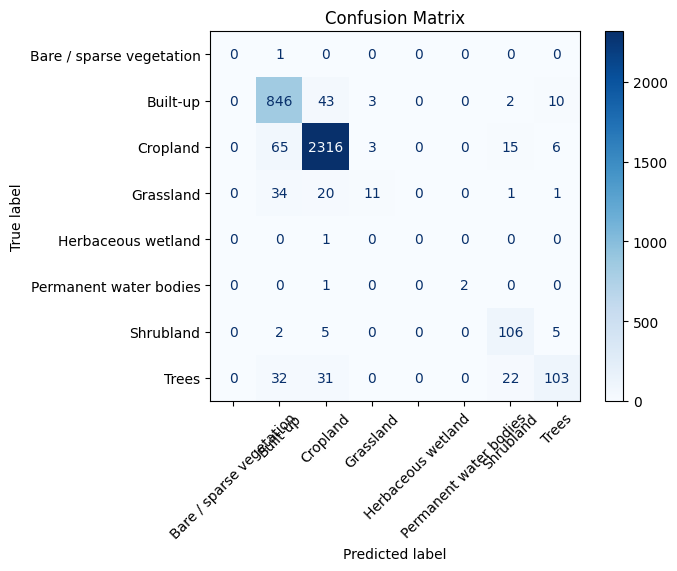

In [23]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(train_dataset.label2idx.keys()))

plt.figure(figsize=(10, 8))
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()


#Q3.5 Plot 5 correct and 5 incorrect predictions with images and labels (1 mark)

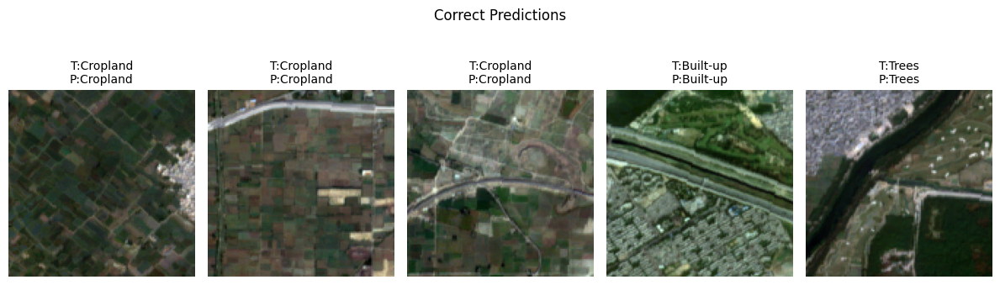

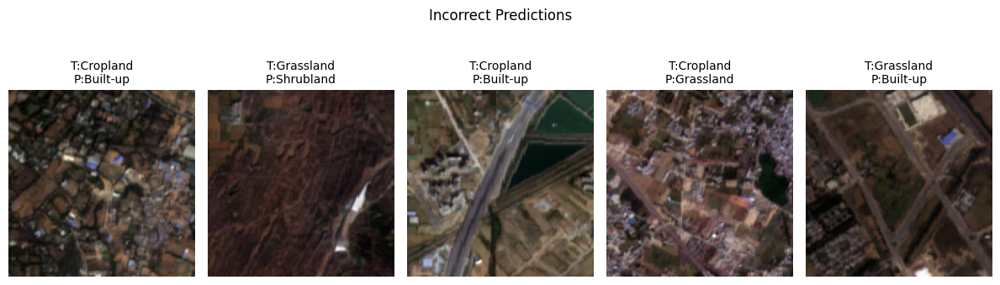

In [24]:
correct, incorrect = [], []

for i, (pred, true) in enumerate(zip(all_preds, all_labels)):
    if pred == true and len(correct) < 5:
        correct.append(i)
    elif pred != true and len(incorrect) < 5:
        incorrect.append(i)

def show_examples(indices, title):
    plt.figure(figsize=(12, 4))
    for i, idx in enumerate(indices):
        row = test_df.iloc[idx]
        img = Image.open(os.path.join(image_folder, row['filename']))
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        true_label = test_dataset.idx2label[all_labels[idx]]
        pred_label = test_dataset.idx2label[all_preds[idx]]
        plt.title(f"T:{true_label}\nP:{pred_label}", fontsize=10)
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

show_examples(correct, "Correct Predictions")
show_examples(incorrect, "Incorrect Predictions")
